# Assignment 1 - London Crime Dataset Visualization
Project ini untuk memenuhi tugas dari Course Introduction To Python For Data Science

Identitas : Yusraini Nurul Asra (PYTN-KS19-017)

# Project Overview
Dataset ini merupakan catatan kejahatan di wilayah metropolitan besar, seperti London, yang terjadi dalam pola yang berbeda. Data ini mencakup jumlah laporan kriminal berdasarkan bulan, wilayah LSOA, dan kategori kejahatan major/minor dari bulan Januari 2008 hingga Desember 2016. Dataset ini diambil dari [Kaggle](https://www.kaggle.com/datasets/jboysen/london-crime) dengan:
- lsoa_code : Kode untuk Area di Greater London.
- borough : Nama wilayah di London.
- major_category : Kategori kejahatan berat.
- minor_category : Kategori kejahatan ringan.
- value : Jumlah laporan kejahatan bulanan di wilayah tertentu.
- year : Tahun laporan, 2008-2016.
- month : Bulan laporan.

## Libraries

In [1]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm
import plotly.express as px
import plotly.graph_objects as go
from wordcloud import WordCloud,STOPWORDS
import folium
from folium import plugins
from geopy.geocoders import Nominatim
from urllib.request import urlopen
import json
%matplotlib inline
mpl.style.use(["seaborn"])


## Data Loading

Mendefinisikan data lalu import file csv dengan pd.read_csv. Setelah itu membuat salinan dari data asli dengan mendefinisikan sebagai df agar data asli tidak rusak.

In [2]:
data = pd.read_csv('london_crime_by_lsoa.csv')
df = data.copy()
df

,lsoa_code,borough,major_category,minor_category,value,year,month
0,E01001116,Croydon,Burglary,Burglary in Other Buildings,0,2016,11
1,E01001646,Greenwich,Violence Against the Person,Other violence,0,2016,11
2,E01000677,Bromley,Violence Against the Person,Other violence,0,2015,5
3,E01003774,Redbridge,Burglary,Burglary in Other Buildings,0,2016,3
4,E01004563,Wandsworth,Robbery,Personal Property,0,2008,6
...,...,...,...,...,...,...,...
13490599,E01000504,Brent,Criminal Damage,Criminal Damage To Dwelling,0,2015,2
13490600,E01002504,Hillingdon,Robbery,Personal Property,1,2015,6
13490601,E01004165,Sutton,Burglary,Burglary in a Dwelling,0,2011,2
13490602,E01001134,Croydon,Robbery,Business Property,0,2011,5


Melihat Informasi lebih detail mengenai struktur DataFrame dapat dilihat menggunakan fungsi info()

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13490604 entries, 0 to 13490603
Data columns (total 7 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   lsoa_code       object
 1   borough         object
 2   major_category  object
 3   minor_category  object
 4   value           int64 
 5   year            int64 
 6   month           int64 
dtypes: int64(3), object(4)
memory usage: 720.5+ MB


Melihat jumlah baris dan jumlah kolom pada data

In [4]:
print("Data tersebut memiliki jumlah baris",len(df), "dan kolom berjumlah",len(df.columns))

Data tersebut memiliki jumlah baris 13490604 dan kolom berjumlah 7


## Data Cleaning and Data Preprocessing

Mengecek apakah terdapat null value pada dataset

In [5]:
df.isnull().sum()

lsoa_code         0
borough           0
major_category    0
minor_category    0
value             0
year              0
month             0
dtype: int64

Mengecek apakah terdapat data duplikat pada dataset

In [6]:
df[df.duplicated(keep=False)]

,lsoa_code,borough,major_category,minor_category,value,year,month


Kolom year dan month akan digabungkan ke dalam kolom baru yakni date, lalu diubah menjadi datetime.

In [7]:
date = []
for i,j in zip(df['year'],df['month']):
    date.append(f'{i} {j}')
df['date'] = date

df['date'] = pd.to_datetime(df['date'])

df.head()

,lsoa_code,borough,major_category,minor_category,value,year,month,date
0,E01001116,Croydon,Burglary,Burglary in Other Buildings,0,2016,11,2016-11-01
1,E01001646,Greenwich,Violence Against the Person,Other violence,0,2016,11,2016-11-01
2,E01000677,Bromley,Violence Against the Person,Other violence,0,2015,5,2015-05-01
3,E01003774,Redbridge,Burglary,Burglary in Other Buildings,0,2016,3,2016-03-01
4,E01004563,Wandsworth,Robbery,Personal Property,0,2008,6,2008-06-01


Melakukan drop pada kolom yang tidak diperlukan. Lalu menjadikan kolom date sebagai index dan mengurutkan dataset berdasarkan date.

In [8]:
df.drop(['lsoa_code','month'],axis=1,inplace=True)
df = df.set_index('date').sort_values('date')
df.head()

,borough,major_category,minor_category,value,year
date,,,,,
2008-01-01,Barking and Dagenham,Burglary,Burglary in Other Buildings,3,2008
2008-01-01,Redbridge,Criminal Damage,Criminal Damage To Dwelling,0,2008
2008-01-01,Barnet,Drugs,Drug Trafficking,0,2008
2008-01-01,Hammersmith and Fulham,Violence Against the Person,Common Assault,0,2008
2008-01-01,Barking and Dagenham,Sexual Offences,Other Sexual,0,2008


## Data Exploration and Data Visualization

### Line Plot
A line plot is a type of data visualization that represents data as a series of points connected by straight lines. It's often used to show how a particular variable changes over time or across different categories.

#### What Year Had The Most Crimes?

Membuat dataframe baru yakni crimes_year yang berisi jumlah kejahatan per tahun.

In [9]:
crimes_year = df.groupby(df.index.year)[['value']].sum()
crimes_year.head()

,value
date,
2008,738641
2009,717214
2010,715324
2011,724915
2012,737329


Membuat line plot untuk memvisualisasikan jumlah kejahatan per tahun.

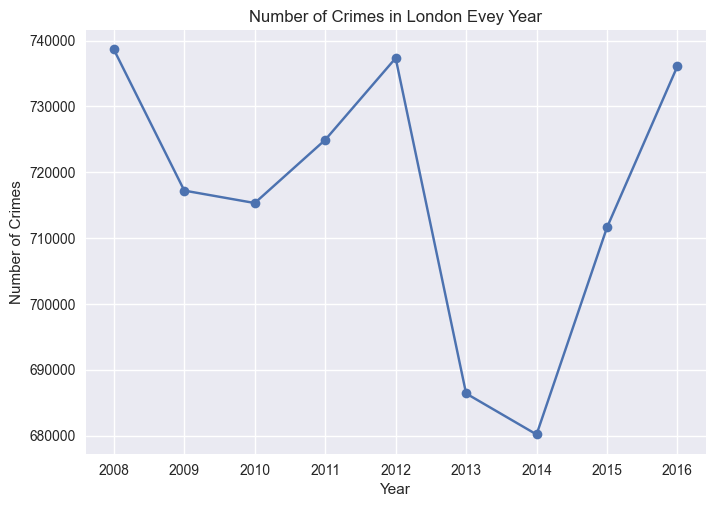

In [10]:
crimes_year.plot(kind='line', marker='o', legend=False)
plt.title('Number of Crimes in London Evey Year')
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.show()

**Kesimpulan:** Line plot menunjukkan jumlah total kejahatan di London per tahun. Grafik ini memiliki sumbu x yang mewakili tahun (Year), sumbu y yang mewakili jumlah kejahatan (Number of Crimes), dan titik-titik data yang dihubungkan oleh garis. Berdasarkan grafik di atas dapat disimpulkan bahwa jumlah kejahatan tertinggi terjadi pada tahun 2008, yaitu sebesar 738.641 dan jumlah kejahatan terendah terjadi pada tahun 2014, yaitu sebesar 680.183. Dapat disimpulkan bahwa selisih antara kejahatan yang terjadi pada tahun tertinggi dan pada tahun terendah adalah 58.458.

#### How's the Minor Category Crimes From 2008-2016?

Melihat jumlah kejahatan minor category 5 tertinggi.

In [11]:
df['minor_category'].value_counts().sort_values(ascending=False).head(5)

minor_category
Common Assault                   522180
Theft From Motor Vehicle         522180
Other Theft                      522180
Burglary in Other Buildings      522072
Theft/Taking Of Motor Vehicle    522072
Name: count, dtype: int64

Kriminalitas yang paling banyak terjadi di London selama 8 tahun terakhir, yaitu Common Assault, Theft From Motor Vehicle, Other Theft, Burglary in Other Buildings, dan Theft/Taking Of Motor Vehicle. Selanjutnya akan mengelompokkan data berdasarkan Top 5 Minor Category dan mengonvert menjadi data frame baru. Lalu menggabungkan dataframe menjadi satu, sehingga diperoleh urutan tahun, dan jumlah masing-masing kejahatan pada Top 5 Minor Category.

In [12]:
top_crimeminor = df.pivot_table(values='value',
                                index=[df.index.year],
                                columns=['minor_category'],
                                aggfunc=np.sum,
                                fill_value=0)

dfcrime1= top_crimeminor['Common Assault']
dfcrime2= top_crimeminor['Theft From Motor Vehicle']
dfcrime3= top_crimeminor['Other Theft']
dfcrime4= top_crimeminor['Burglary in Other Buildings']
dfcrime5= top_crimeminor['Theft/Taking Of Motor Vehicle']

dfcrime= [dfcrime1, dfcrime2, dfcrime3, dfcrime4, dfcrime5] 
df_top5MinorCrime= pd.concat(dfcrime, join='outer', axis=1).fillna(0)
df_top5MinorCrime.index.name=None
df_top5MinorCrime

,Common Assault,Theft From Motor Vehicle,Other Theft,Burglary in Other Buildings,Theft/Taking Of Motor Vehicle
2008,37356,76570,99280,31437,28303
2009,39671,68856,95424,30434,24476
2010,41591,69709,103997,29703,24890
2011,40502,69604,113616,30876,26161
2012,39246,68198,132056,31676,22464
2013,37882,63509,115757,30685,20377
2014,51244,52167,108577,27078,21653
2015,61758,50024,107571,25833,21848
2016,64440,51319,103807,25289,26366


Membuat line plot untuk memvisualisasikannya.

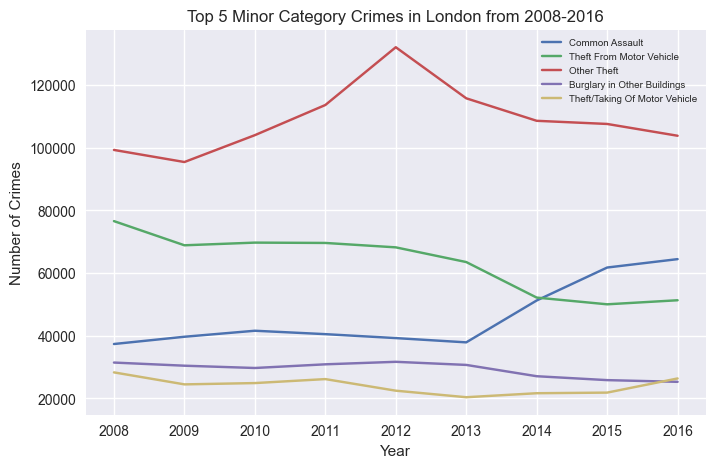

In [13]:
df_top5MinorCrime.plot(kind='line', figsize=(8,5))   # memanggil plot line dan menentukan ukuran 
plt.title('Top 5 Minor Category Crimes in London from 2008-2016')   # memberi judul plot line
plt.ylabel('Number of Crimes')  # label sumbu y
plt.xlabel('Year')  # label sumbu x
plt.legend(loc='upper right', prop={'size': 7}) # menyeting tempat dan ukuran legend
plt.show()  # menampilkan plot

**Kesimpulan:** Dapat dilihat untuk masing-masing minor category crimes, Common Assault cenderung mengalami kenaikan setiap tahunnya, Other Theft cukup fluktuatif di setiap tahunnya, serta tiga kejahatan sisanya cenderung mengalami penurunan di setiap tahunnya. 

### Bar Chart
A bar plot, or bar chart, is a data visualization that uses rectangular bars of varying heights to represent data values.

#### How's the Crimes in Each Month?

Membuat dataframe berisikan bulan dan juga count crimes, bulan akan dilakukan map() dengan bulan di bahasa Indonesia.

In [14]:
crimes_month = df.groupby(df.index.month)[['value']].sum().reset_index()
bulan = {1: 'Januari',
         2: 'Februari',
         3: 'Maret',
         4: 'April',
         5: 'Mei',
         6: 'Juni',
         7: 'Juli',
         8: 'Agustus',
         9: 'September',
         10: 'Oktober',
         11: 'November',
         12: 'Desember'}
crimes_month['date'] = crimes_month['date'].map(bulan)
crimes_month

,date,value
0,Januari,530247
1,Februari,500537
2,Maret,551795
3,April,520648
4,Mei,552704
5,Juni,549041
6,Juli,563076
7,Agustus,532784
8,September,522377
9,Oktober,558252


Membuat bar chart untuk memvisualisasikannya.

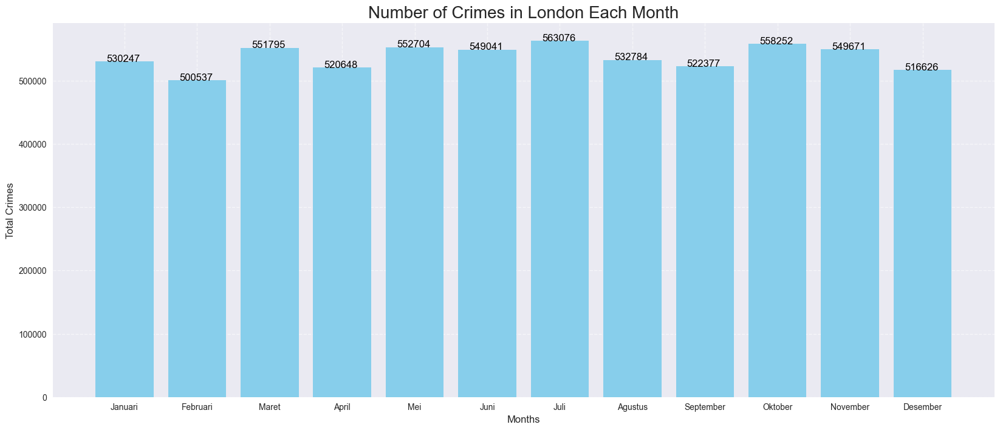

In [15]:
plt.figure(figsize=(20, 8))

bars = plt.bar(crimes_month['date'], crimes_month['value'], color='skyblue')
plt.bar(crimes_month['date'], crimes_month['value'], color='skyblue')

plt.title('Number of Crimes in London Each Month',fontsize=20)
plt.xlabel('Months',fontsize=12)
plt.ylabel('Total Crimes',fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)

for bar in bars:
    plt.text(bar.get_x() + bar.get_width() / 1.5 - 0.15, bar.get_height() +
             5, int(bar.get_height()), ha='center', color='black', fontsize=12)
plt.show()

**Kesimpulan:** Dari barchart di atas kita dapat melihat distribusi kejahatan dari tahun 2008-2016 pada bulan Januari sampai Desember. Dari situ kita dapat melihat bahwa total kejahatan terendah terjadi pada februari yakni dengan jumlah total sebesar 500537 dan berada pada puncak pada bulan Juli sebanyak 563076 tindak kejahatan yang tergabung dari kategori minor dan major.

#### Major Category Crimes in Each Borough

Membuat dataframe baru yang berisikan value major category dan borough.

In [16]:
bor_maj = df.groupby(['borough','major_category'])['value'].sum().unstack()
bor_maj.head()

major_category,Burglary,Criminal Damage,Drugs,Fraud or Forgery,Other Notifiable Offences,Robbery,Sexual Offences,Theft and Handling,Violence Against the Person
borough,,,,,,,,,
Barking and Dagenham,18103.0,18888.0,9188.0,205.0,2819.0,6105.0,49.0,50999.0,43091.0
Barnet,36981.0,21024.0,9796.0,175.0,2953.0,7374.0,38.0,87285.0,46565.0
Bexley,14973.0,17244.0,7346.0,106.0,1999.0,2338.0,22.0,40071.0,30037.0
Brent,28923.0,20569.0,25978.0,157.0,3711.0,12473.0,39.0,72523.0,63178.0
Bromley,27135.0,24039.0,8942.0,196.0,2637.0,4868.0,31.0,69742.0,46759.0


Membuat bar chart untuk memvisualisasikan setiap major category crime di seluruh borough.

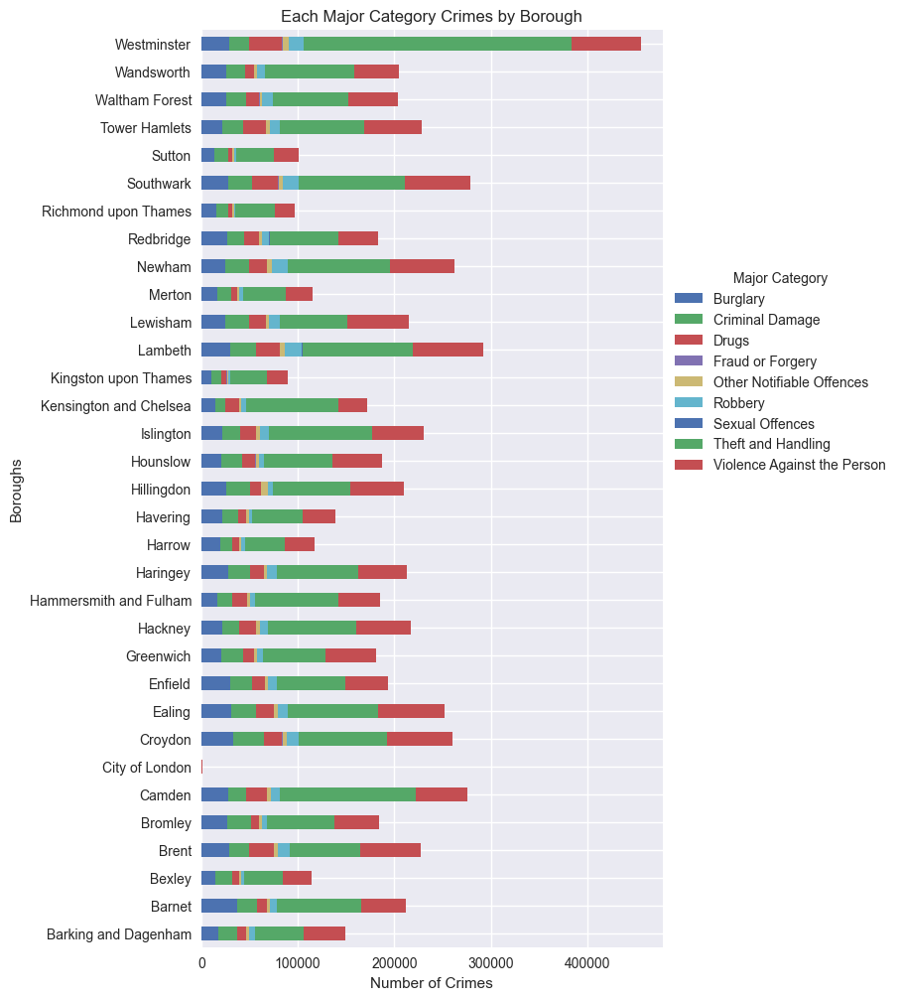

In [17]:
# Plot a stacked bar chart for each year
fig, ax = plt.subplots(figsize=(6, 12))  # Adjust the figure size as needed
bor_maj.plot(kind='barh', stacked=True, ax=ax)
plt.title('Each Major Category Crimes by Borough')
plt.xlabel('Number of Crimes')
plt.ylabel('Boroughs')
plt.legend(title='Major Category', bbox_to_anchor=(1, 0.75), loc='upper left')
plt.show()

**Kesimpulan:** Berdasarkan bar plot di atas, dapat dilihat bahwa Westminster memiliki jumlah kejahatan tertinggi sebanyak lebih dari 400k crimes, dengan theft and handling menjadi kejahatan yang paling sering terjadi dibandingkan kejahatan lainnya. Disusul dengan Lambeth, Southwark dan Camden sebagai borough yang memiliki kejahatan tertinggi setelah Westminster.

### Pie Chart
A pie chart is a circular statistical graphic that is divided into slices to illustrate numerical proportion. Each slice of the pie represents a specific category or proportion, and the size of each slice is directly proportional to the quantity it represents.

#### How's the Major Category Crimes in the Safest Borough?

Karena pada barchart borough City of London memiliki tingkat major category crimes terendah, maka akan divisualisasikan pada pie chart berikut. Terlebih dahulu buat dataframe major category crimes di City of London.

In [18]:
cl_maj = df[(df['borough'] == 'City of London')].groupby('major_category')['value'].sum()
cl_maj

major_category
Burglary                        15
Criminal Damage                 16
Drugs                           33
Other Notifiable Offences       17
Robbery                         24
Theft and Handling             561
Violence Against the Person    114
Name: value, dtype: int64

Memvisualisasikannya dengan pie chart seperti berikut.

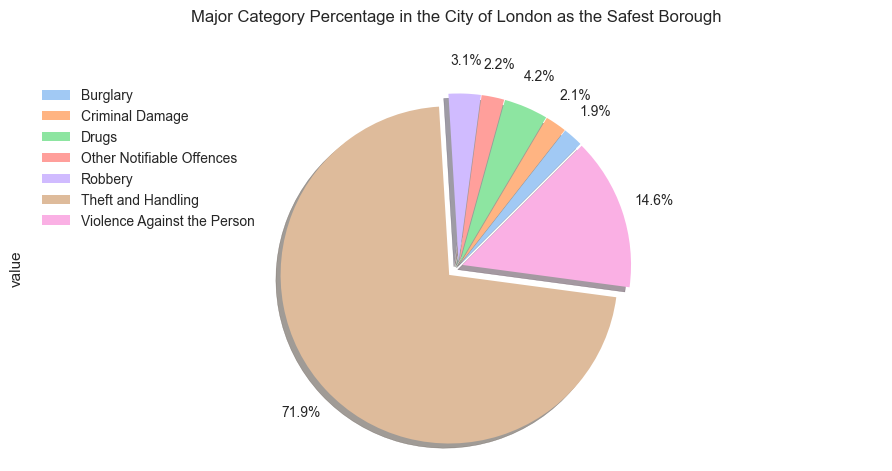

In [19]:
pastel_colors = sns.color_palette("pastel", len(cl_maj))
explode_list = [0.025, 0.025, 0.025, 0.025, 0.025, 0.075, 0.025]

cl_maj.plot(kind='pie',
        figsize=(11,5),
        autopct='%1.1f%%',
        startangle=45,
        shadow=True,
        labels=None,
        pctdistance=1.2,
        colors=pastel_colors,
        explode=explode_list)

plt.legend(labels=cl_maj.index,loc='upper left')
plt.axis('equal')
plt.title('Major Category Percentage in the City of London as the Safest Borough',y=1.12)
plt.show()

**Kesimpulan:** Pie chart menunjukkan persentase dari berbagai jenis kejahatan dalam minor category di City of London. Berdasarkan pie chart di atas dapat disimpulkan bahwa jenis kejahatan tertinggi di London adalah Theft and Handling dengan jumlah persentase sebesar 71.9%. Disusul dengan Violence Against the Person sebesar 14.6%, dan sebesar 13.5% sisanya.

### Area Plot
Area chart is a data visualization that represents the data using filled areas under a line or curve. 

#### Total Crimes of Top 5 Borough in London Over the Years

Terlebih dahulu buat dataframe top 5 borough dengan tingkat kejahatan tertinggi sebagai berikut.

In [20]:
# Top 5 London boroughs dengan tingkat kejahatan tertinggi
top5_borough = df.groupby('borough')[['value']].sum().sort_values('value',ascending=False).head().index

# Melihat jumlah kejahatan berdasarkan tahun pada top 5 borough dengan kejahatan tertinggi
top5 = df[df['borough'].isin(top5_borough)][['borough','value']]
top5 = top5.groupby(['borough',top5.index.year])[['value']].sum().reset_index()

# Membuat Pivot Table untuk mentransform boroughs menjadi columns
top5_crimes = top5.pivot(index='date', columns='borough', values='value')
top5_crimes.head()

borough,Camden,Lambeth,Newham,Southwark,Westminster
date,,,,,
2008,32010,31717,29752,33470,47846
2009,31612,31225,28610,30623,48456
2010,31804,31671,30728,31320,48116
2011,33956,33224,27978,30723,54243
2012,31472,33473,30067,30737,59226


Memvisualisasikan dataframe tersebut dengan area plot di bawah.

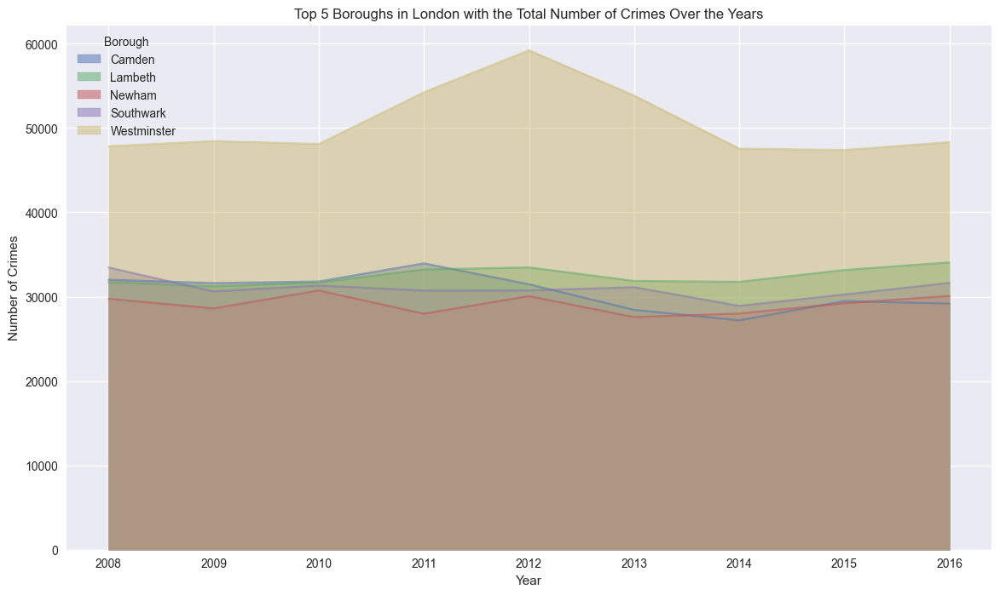

In [21]:
# Make area plot
top5_crimes.plot(kind='area', stacked=False, figsize=(14,8))
plt.title('Top 5 Boroughs in London with the Total Number of Crimes Over the Years')
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.legend(title='Borough', loc='upper left')
plt.show()

**Kesimpulan:** Area plot menunjukkan total jumlah kejahatan pada lima wilayah (borough) teratas dengan jumlah kejahatan tertinggi di London selama beberapa tahun. Pada sumbu horizontal, terdapat tahun-tahun berbeda, sedangkan pada sumbu vertikal, terdapat jumlah kejahatan. Berdasarkan grafik di atas dapat disimpulkan bahwa 5 borough dengan tingkat kejahatan tertinggi adalah Westminster, Lambeth, Camden, Southwark, dan Newham.

### Boxplot and Histogram
- A box plot, also known as a box-and-whisker plot, is a graphical representation of a dataset's summary statistics. It provides a way to visualize the distribution, central tendency, and spread of a dataset. 
- A histogram plot is a graphical representation of the distribution of a dataset. It divides the data into intervals or bins and shows the frequency or count of data points falling into each bin. 

#### Top 3 Borough with Highest Burglary Crimes

Melihat top 3 borough dengan kejahatan burglary tertinggi.

In [22]:
burglary = df[(df['major_category'] == 'Burglary')].groupby('borough')['value'].sum().sort_values(ascending=False).head(3)
burglary

borough
Barnet     36981
Croydon    33376
Ealing     30831
Name: value, dtype: int64

Mengelompokan kasus kejahatan Burglary di borough Barnet, Croydon dan Ealing.

In [23]:
Barnet = df[(df['major_category'] == 'Burglary') & (df['borough'] == 'Barnet') 
               & (df['year'] >= 2010)].groupby('year')['value'].sum().to_frame()
Barnet.rename(columns={'value': 'Burglary in Barnet'}, inplace=True)
Barnet.index.name=None

Croydon = df[(df['major_category'] == 'Burglary') & (df['borough'] == 'Croydon') 
                & (df['year'] >= 2010)].groupby('year')['value'].sum().to_frame()
Croydon.rename(columns={'value': 'Burglary in Croydon'}, inplace=True)
Croydon.index.name=None

Ealing = df[(df['major_category'] == 'Burglary') & (df['borough'] == 'Ealing') 
                & (df['year'] >= 2010)].groupby('year')['value'].sum().to_frame()
Ealing.rename(columns={'value': 'Burglary in Ealing'}, inplace=True)
Ealing.index.name=None

Menggabungkan data kasus kejahatn Burglary di borough Barnet, Croydon dan Ealing.

In [24]:
burglary = pd.concat([Barnet,Croydon,Ealing], axis=1)
burglary

,Burglary in Barnet,Burglary in Croydon,Burglary in Ealing
2010,4300,4219,3738
2011,4873,4619,3824
2012,4830,4038,3940
2013,4262,3958,3584
2014,3621,3139,2905
2015,3853,2718,2630
2016,3402,2738,2492


In [25]:
burglary.describe()

,Burglary in Barnet,Burglary in Croydon,Burglary in Ealing
count,7.000000,7.000000,7.000000
mean,4163.000000,3632.714286,3301.857143
std,569.582303,760.211311,607.514178
min,3402.000000,2718.000000,2492.000000
25%,3737.000000,2938.500000,2767.500000
50%,4262.000000,3958.000000,3584.000000
75%,4565.000000,4128.500000,3781.000000
max,4873.000000,4619.000000,3940.000000


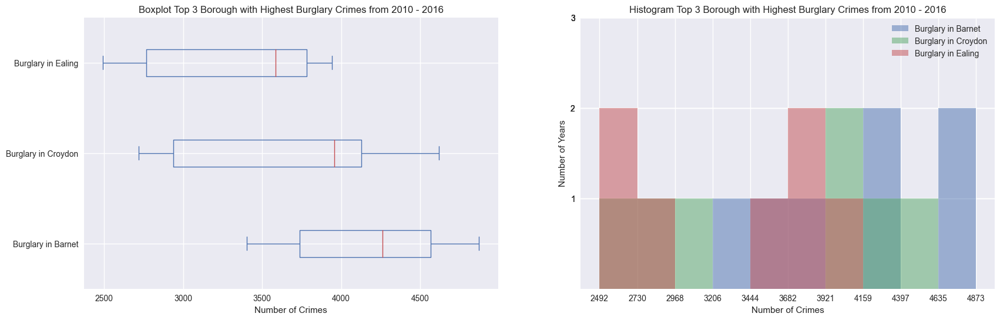

In [26]:
count, bin = np.histogram(burglary) 

fig = plt.figure() # create figure
ax0 = fig.add_subplot(1, 2, 1) # add subplot 1 (1 row, 2 columns, first plot)
ax1 = fig.add_subplot(1, 2, 2) # add subplot 2 (1 row, 2 columns, second plot)

# Subplot 1: Box plot
burglary.plot(kind='box', vert=False, figsize=(20, 6), ax=ax0)
ax0.set_title('Boxplot Top 3 Borough with Highest Burglary Crimes from 2010 - 2016')
ax0.set_xlabel('Number of Crimes')

# Subplot 2: Histogram
burglary.plot(kind='hist', figsize=(20, 6), xticks=bin, yticks=count, alpha=0.5, ax=ax1)
ax1.set_title('Histogram Top 3 Borough with Highest Burglary Crimes from 2010 - 2016')
ax1.set_ylabel('Number of Years')
ax1.set_xlabel('Number of Crimes')

plt.show()

**Kesimpulan:**

Berdasarkan Box plot, diketahui bahwa: 
- Jumlah kejahatan Bulglary di kota Ealing lebih sedikit dibandingkan kota Barnet dan kota Croydon di sepanjang tahun 2010-2016. Hal ini dapat diketahui sesuai dengan posisi box plot di kota Ealing yang lebih rendah dibanding box plot di kota Barnet dan kota Croydon.
- Garis merah menandakan rata-rata dari jumlah kejahatan Bulglary di kota Barnet, yaitu sebanyak 4163 kasus. Dan rata-rata jumlah kejahatan Bulglary di kota Croydon, yaitu sebanyak 3633 kasus. Serta rata-rata jumlah kejahatan Bulglary di kota Ealing, yaitu sebanyak 3302 kasus.
- Total kasus Bulglary di kota Barnet terbanyak sebesar 4873 kasus, dan terendah sebanyak 3402 kasus. Dan total kasus Bulglary di kota Croydon terbanyak sebesar 4619 kasus, dan terendah sebanyak 2718 kasus. Sedangkan total kasus Bulglary di kota Ealing terbanyak sebesar 3940 kasus, dan terendah sebanyak 2492 kasus. 

Berdasarkan Histogram, diketahui bahwa jumlah kejahatan Burglary yang terjadi di Kota Barnet pada tahun 2010-2016 yang terjadi, adalah sebagai berikut: 
- Terdapat 1 tahun yang memiliki jumlah tindak kriminal diantara range 3206 - 3921 kasus.
- Terdapat 2 tahun yang memiliki jumlah tindak kriminal diantara range 41599-4397 kasus dan range 4635-4873 kasus.

Berdasarkan Histogram, diketahui bahwa jumlah kejahatan Burglary yang terjadi di Kota Croydon pada tahun 2010-2016 yang terjadi, adalah sebagai berikut:
- Terdapat 1 tahun yang memiliki jumlah tindak kriminal diantara range 2492-3206 kasus dan range 4159-4635 kasus.
- Terdapat 2 tahun yang memiliki jumlah tindak kriminal diantara range 3921-4159 kasus.

Berdasarkan Histogram, diketahui bahwa jumlah kejahatan Burglary yang terjadi di Kota Ealing pada tahun 2010-2016 yang terjadi, adalah sebagai berikut:
- Terdapat 1 tahun yang memiliki jumlah tindak kriminal diantara range 2730-2968 kasus dan range 3444-3682 kasus dan range 3912-4159 kasus.
- Terdapat 2 tahun yang memiliki jumlah tindak kriminal diantara range 2492-2730 kasus dan range 3682-3921 kasus.

### Scatter Plot and QQ-Plot
Scatter plot is a type of data visualization that displays individual data points as dots or markers on a two-dimensional plane.

#### Do the Data Normally Distributed?

In [27]:
value_per_month = pd.DataFrame(df.groupby(['date'])['value'].sum().reset_index())
value_per_month

,date,value
0,2008-01-01,65419
1,2008-02-01,62626
2,2008-03-01,61343
3,2008-04-01,59640
4,2008-05-01,62587
...,...,...
103,2016-08-01,62666
104,2016-09-01,61412
105,2016-10-01,63405
106,2016-11-01,61064


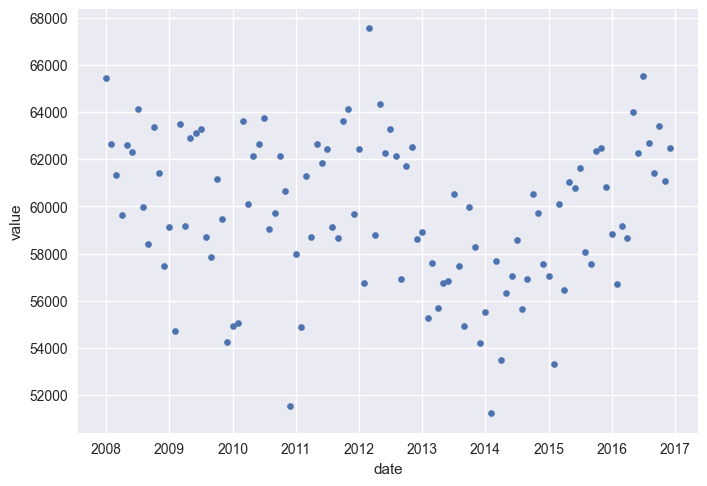

In [28]:
value_per_month.plot.scatter(x='date', y='value')
plt.show()

**Kesimpulan:** Scatter plot memvisualisasikan bagaimana jumlah kejahatan berubah seiring berjalannya waktu. Setiap titik pada grafik mewakili jumlah total kejahatan yang tercatat untuk tanggal tertentu. Dengan melihat pola titik-titik tersebut, dapat diidentifikasi apakah terdapat lonjakan atau penurunan kejahatan dalam rentang waktu tertentu. Berdasarkan grafik di atas dapat dilihat bahwa sebaran data acak atau tidak membentuk pola tertentu maka dapat disimpulkan bahwa uji normalitas secara linier terpenuhi.

Untuk melihat bahwa data berdistribusi normal, dapat dilakukan uji menggunakan Q-Q plot dan uji hipotesis secara formal.

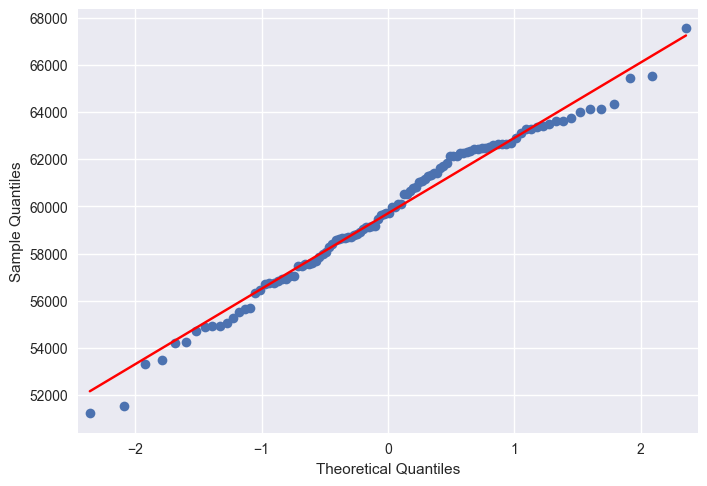

In [29]:
# Create a Q-Q plot for visual normality test
sm.qqplot(value_per_month['value'], line='s') 
plt.show()

Q-Q plot adalah plot yang digunakan untuk memvisualisasikan distribusi data apakah mendekati distribusi normal atau tidak. Dalam hal ini, Q-Q plot digunakan untuk melakukan pengujian visual terhadap normalitas data jumlah kejahatan per bulan.

**Kesimpulan:**
Output dari Q-Q plot ini menampilkan titik-titik yang menggambarkan bagaimana data sebenarnya mendistribusikan diri terhadap distribusi normal yang diharapkan. Jika titik-titik ini mendekati garis lurus dengan sudut 45 derajat, maka data cenderung terdistribusi normal. Jika titik-titik tersebut deviasi dari garis tersebut, maka data tidak terdistribusi normal. Pada Normal Q-Q Plot of Unstandardized Residual dapat dilihat bahwa plot-plot mengikuti garis lurus, sehingga dapat disimpulkan bahwa residual berdistribusi normal. Maka asumsi normalitas terpenuhi secara visual.

#### Uji Hipotesis Formal

In [30]:
# Normality test dengan Shapiro-Wilk
alpha = 0.05
stat, p_value = stats.shapiro(value_per_month['value'])
print(p_value)

# Check if the data is normally distributed
if p_value > alpha:
    print("The data is normally distributed (no evidence to reject H0).")
else:
    print("The data is not normally distributed (evidence to reject H0).")

0.1789938062429428
The data is normally distributed (no evidence to reject H0).


- **Hipotesis:** 

H0 : Berdistribusi normal

H1 : Tidak berdistribusi normal

- **Taraf Signfikansi:**

α = 5%

- **Statistik Uji:**

Statistik uji dengan menggunakan nilai sig Shapiro-Wilk.

- **Daerah Kritis:**

Tolak H0 jika sig < α

- **Keputusan:**

H0  gagal ditolak sig > α

- ****Kesimpulan:****

Pada taraf signifikansi α = 5%, H0  gagal ditolak sig (0,1789) > α (0,05) sehingga dapat disimpulkan bahwa data berdistribusi normal.

### Word Clouds
A word cloud is a visual representation of text data where words are displayed in varying sizes and colors. The size of each word in the word cloud is typically proportional to its frequency or importance in the given text. 

#### What are the Most Frequently Occurring Words in Minor Categories?

Membuat wordcloud untuk menemukan kata yang paling sering muncul di minor category

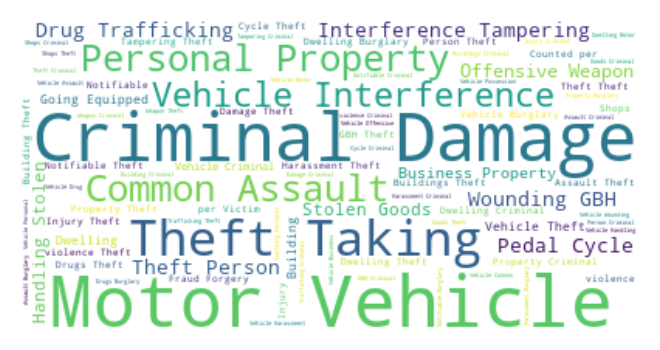

In [31]:
stopwords = set(STOPWORDS)

plt.figure(figsize=(4,4),dpi=200)
crimes_wordcloud = WordCloud(background_color='white',
                             stopwords=stopwords).generate(' '.join(df['minor_category']))
plt.imshow(crimes_wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

**Kesimpulan:** WordCloud menggambarkan kata-kata atau frasa yang paling sering muncul dalam minor category dari data yang diambil sebagai sampel. Bedasarkan hasil WordCloud di atas, kata yang paling sering muncul adalah Motor Vehicle dan Criminal Damage.

### Folium Maps and Choropleth Maps
- Folium is a Python library used for creating interactive leaflet maps. It's often used for visualizing geographic data.
- A choropleth map is a type of thematic map in which areas are shaded or patterned in proportion to the value of a variable being represented. These maps are commonly used to visualize and display geographic data, especially when dealing with regional or spatial variations in data. 

**NB**: Karena pada website github tidak support untuk membuka plot interaktif maps dapat dilihat pada alternatif lain yaitu dengan menggunakan NBViewer pada [link berikut](https://nbviewer.org/github/yusrainiasraa/H8_PYTN-KS19-017_5/blob/main/Assignment/PYTN_Assgn_1_5_Yusraini/PYTN_Assgn_1_5_Yusraini.ipynb).

#### How were Crimes in London in General?

Mengurutkan dataset berdasarkan kolom daerah dan didefinisikan sebagai borough_order

In [32]:
borough_order = df.sort_values('borough')
borough_order.head()

,borough,major_category,minor_category,value,year
date,,,,,
2008-01-01,Barking and Dagenham,Burglary,Burglary in Other Buildings,3,2008
2009-08-01,Barking and Dagenham,Criminal Damage,Criminal Damage To Dwelling,1,2009
2012-02-01,Barking and Dagenham,Theft and Handling,Motor Vehicle Interference & Tampering,0,2012
2013-11-01,Barking and Dagenham,Theft and Handling,Theft From Shops,0,2013
2013-11-01,Barking and Dagenham,Criminal Damage,Criminal Damage To Dwelling,2,2013


Mencari titik koordinat, yaitu latitude dan longitude di setiap daerah

In [33]:
from geopy.geocoders import Nominatim

geolocator = Nominatim(user_agent='MyApp')

latitude,longitude = ([] for i in range(2))
for i in borough_order['borough'].unique():
    location = geolocator.geocode(i,timeout=None)
    latitude.append(location.latitude)
    longitude.append(location.longitude)

Split dataset borough_order berdasarkan borough untuk memudahkan

In [34]:
temp_borough = []
for i in borough_order['borough'].unique():
    temp_borough.append(borough_order[borough_order['borough'] == i])

Memasukkan titik koordinat ke borough yang telah di-split

In [35]:
for i,j,k in zip(temp_borough,latitude,longitude):
    i.insert(4,'latitude',j)
    i.insert(5,'longitude',k)

Menggabungkan dataset yang telah di-split dan mengurutkan berdasarkan date index

In [36]:
borough_coordinate = pd.concat(temp_borough)
borough_coordinate = borough_coordinate.sort_index()
borough_coordinate.head()

,borough,major_category,minor_category,value,latitude,longitude,year
date,,,,,,,
2008-01-01,Barking and Dagenham,Burglary,Burglary in Other Buildings,3,51.554091,0.150489,2008
2008-01-01,Richmond upon Thames,Theft and Handling,Handling Stolen Goods,0,51.440553,-0.307639,2008
2008-01-01,Brent,Drugs,Possession Of Drugs,0,32.937346,-87.164718,2008
2008-01-01,Richmond upon Thames,Robbery,Personal Property,0,51.440553,-0.307639,2008
2008-01-01,Brent,Violence Against the Person,Harassment,0,32.937346,-87.164718,2008


Untuk mengurangi computational cost, akan diambil 5000 sample dari dataset

In [37]:
borough_coordinate_sample = borough_coordinate.sample(n=5000,random_state=42,axis=0)
borough_coordinate_sample.head()

,borough,major_category,minor_category,value,latitude,longitude,year
date,,,,,,,
2016-01-01,Tower Hamlets,Burglary,Burglary in a Dwelling,0,51.128863,1.298669,2016
2008-09-01,Croydon,Criminal Damage,Other Criminal Damage,1,51.371305,-0.101957,2008
2008-05-01,Camden,Theft and Handling,Theft From Motor Vehicle,1,39.944840,-75.119891,2008
2010-02-01,Newham,Violence Against the Person,Harassment,0,51.530016,0.029309,2010
2013-12-01,Greenwich,Other Notifiable Offences,Going Equipped,0,51.468626,0.048831,2013


Mencari titik koordinat di London

In [38]:
london = geolocator.geocode('London',timeout=None)

print(f"London's latitude\t:{london.latitude}")
print(f"London's longitude\t:{london.longitude}")

London's latitude	:51.5074456
London's longitude	:-0.1277653


Membuat folium map untuk menampilkan kejahatan yang terjadi di London secara umum

In [39]:
from folium import plugins

london_map = folium.Map(location=[london.latitude,london.longitude],zoom_start=10)

crimes = plugins.MarkerCluster().add_to(london_map)

for i,j,k in zip(borough_coordinate_sample['latitude'],
                 borough_coordinate_sample['longitude'],
                 borough_coordinate_sample['major_category']):
    folium.Marker(location=[i,j],
                  icon=None,
                  popup=k).add_to(crimes)

london_map

**Kesimpulan:** Berdasarkan peta di atas, terlihat bahwa kejahatan di sebagian besar wilayah berkisar antara 100 hingga 500, kecuali satu wilayah tengah yang memiliki lebih dari 700 kejahatan.

Download GeoJSON file yang mendefinisikan daerah di London

In [40]:
from urllib.request import urlopen
import json
with urlopen('https://skgrange.github.io/www/data/london_boroughs.json') as response:
    london_boroughs = json.load(response)

Mengambil ID untuk tiap daerah dari GeoJSON file

In [41]:
boroughs_id = {}
for i in london_boroughs['features']:
    i['id'] = i['properties']['id']
    boroughs_id[i['properties']['name']] = i['id']

Menambahkan ID ke dataframe

In [42]:
borough_crimes = df.groupby('borough')[['value']].sum().reset_index()
borough_crimes['id'] = borough_crimes['borough'].apply(lambda x: boroughs_id[x])
borough_crimes.head()

,borough,value,id
0,Barking and Dagenham,149447,32
1,Barnet,212191,10
2,Bexley,114136,15
3,Brent,227551,9
4,Bromley,184349,3


Membuat Chloropleth Maps untuk memvisualisasikan jumlah kejahatan di London pada tahun 2008-2016

In [43]:
fig = go.Figure()
fig = px.choropleth_mapbox(borough_crimes,
                           geojson=london_boroughs,
                           locations='id',
                           color='value',
                           color_continuous_scale='pubu',
                           mapbox_style='carto-positron',
                           labels={'id':'ID','value':'Number of Crimes'},
                           hover_name='borough',
                           center={'lat':london.latitude - 0.02,'lon':london.longitude},
                           zoom=8.7)
fig.update_layout(margin={'r':0,'l':0,'b':0},title='Number of Crimes in London from 2008 - 2016',title_x=0.5)
fig.show()

**Kesimpulan:** Berdasarkan gambar Choropleth Maps di atas, dapat disimpulkan bahwa Borough Westminster memiliki warna biru yang paling gelap yang memandakan bahwa wilayah itu memiliki jumlah kasus kejahatan tertinggi, kemudian wilayah dengan warna biru sedang adalah wilayah yang memiliki jumlah kasus kriminal dengan jumlah sedang, begitupun berikutnya semakin muda warna birunya maka kasus kejahatan di daerah tersebut semakin berkurang.